## Comparing health regions to the state trend
https://github.com/garethcull/forecastr

In [ ]:
# check prophet version
import fbprophet
from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot
from pycaret.anomaly import *
# print version number
print('Prophet %s' % fbprophet.__version__)
from pylab import rcParams


In [2]:

import matplotlib
import matplotlib.pyplot as plt
from pandas import read_csv
from pandas import Grouper
from pandas import DataFrame
from pandas import to_datetime
from datetime import datetime
from dateutil.relativedelta import relativedelta

from sklearn.metrics import mean_absolute_error
import pandas as pd
from matplotlib.dates import DateFormatter
from pandas.plotting import lag_plot, autocorrelation_plot
from sklearn.model_selection import ParameterGrid
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import holidays
import random

from celluloid import Camera
from collections import defaultdict
from functools import partial
from tqdm import tqdm

from tsmoothie.utils_func import sim_randomwalk, sim_seasonal_data
from tsmoothie.smoother import *
from tsmoothie.smoother import LowessSmoother
import ffmpeg

import numpy as np

#plots
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go



# Call the function to read malaria case dataframe
from functions.amazonmalariadata import prepareTimeSeries,readMalariaData,formatColumnData,extractNegativesByStateByMonth

import warnings

import pickle


## Read in the Dataset belonging to a given state and extract data for each health region in the state

In [2]:
%%time
#highPrevalenceStatesCodes = ['AM','PA','AC','AP','RR','RO','MA','MT']

currentState = 'PA'
#integratedDataset = readMalariaData(currentState)
malariaIntegratedDataset = formatColumnData(integratedDataset)
numRecords = len(malariaIntegratedDataset['notification.year'])
print(numRecords)

4015621
Wall time: 14min 12s


In [3]:
#Load pre-processed State's case data
series = read_csv('PA.csv', header=0, index_col=0,parse_dates=True, squeeze=True)
series.head()

,notification.year,notification.month,monthlyPrevalence,negatives,positives,totalTests
Date,,,,,,
2009-01-01,2009,1,0.211005,29050,7769,36819
2009-02-01,2009,2,0.191367,30834,7297,38131
2009-03-01,2009,3,0.163140,38560,7517,46077
2009-04-01,2009,4,0.164288,34606,6803,41409
2009-05-01,2009,5,0.180507,34667,7636,42303


In [4]:
malariaIntegratedDataset.head()

,infection.county,home.county,notification.county,qty.parasites,scheme,notification.hr,home.hr,infection.hr,exam.type,exam.result,gender,hemiparasite,symptom,race,occupation,detection.type,education.level,pregnancy,crosses,cvl.case,home.state,infection.state,notification.state,home.country,infection.country,migration,autochthonous.case,age,notification.month,notification.year,exam.month,exam.year,treatment.month,treatment.year,symptom.month,symptom.year,exam.interval,treatment.interval,notification.interval,previous.treatment
27316,110013.0,150680.0,150680,500,1,BAIXO AMAZONAS,BAIXO AMAZONAS,VALE DO JAMARI,0,vivax,male,0,yes,0,panning,active,incomplete secondary school,not applicable,one cross,no,PA,RO,PA,Brazil,Brazil,no,no,25 to 34 years old,1,2009,1.0,2009.0,1.0,2009.0,12.0,2008.0,on the same day,on the same day,1 to 7 days,0
35602,110013.0,150680.0,150680,200,1,BAIXO AMAZONAS,BAIXO AMAZONAS,VALE DO JAMARI,0,vivax,female,0,yes,0,agriculture,active,complete secondary school,no,less than half cross,no,PA,RO,PA,Brazil,Brazil,no,no,25 to 34 years old,1,2009,1.0,2009.0,1.0,2009.0,12.0,2008.0,on the same day,on the same day,1 to 7 days,0
58131,110020.0,150805.0,150805,9000,1,TAPAJOS,TAPAJOS,MADEIRA-MAMORE,0,vivax,male,0,yes,0,panning,CVL,incomplete college,not applicable,two crosses,yes,PA,RO,PA,Brazil,Brazil,no,no,25 to 34 years old,1,2009,1.0,2009.0,1.0,2009.0,1.0,2009.0,on the same day,on the same day,1 to 7 days,0
149031,110020.0,150680.0,150680,500,1,BAIXO AMAZONAS,BAIXO AMAZONAS,MADEIRA-MAMORE,0,vivax,male,0,yes,0,other,active,incomplete primary school,not applicable,one cross,no,PA,RO,PA,Brazil,Brazil,no,no,45 to 54 years old,1,2009,1.0,2009.0,1.0,2009.0,12.0,2008.0,on the same day,on the same day,8 to 30 days,0
621851,130008.0,150080.0,150080,10000,1,METROPOLITANA I,METROPOLITANA I,RIO NEGRO E SOLIMOES,0,vivax,male,0,yes,0,ignored,active,incomplete primary school,not applicable,two crosses,no,PA,AM,PA,Brazil,Brazil,no,no,05 to 14 years old,1,2009,1.0,2009.0,1.0,2009.0,1.0,2009.0,on the same day,on the same day,1 to 7 days,0


## Check unique number of counties and health regions (municipalities)

In [5]:
%%time
malariaStat = malariaIntegratedDataset.loc[(malariaIntegratedDataset[['notification.county']] != 0).all(axis=1)]
malariaCountyUnique = malariaStat['notification.county'].unique()
lenNotNull = len(malariaStat)
print(f"Non-null County of Notification values: {len(malariaStat)},Percent: {lenNotNull/numRecords}, Unique values: {len(malariaCountyUnique)}")

Non-null County of Notification values: 4015621,Percent: 1.0, Unique values: 143
Wall time: 12.4 s


In [8]:
%%time
malariaStat = malariaIntegratedDataset.loc[(malariaIntegratedDataset[['notification.hr']] != 0).all(axis=1)]
malariaHrUnique = malariaStat['notification.hr'].unique()
lenNotNull = len(malariaStat)
print(f"Non-null health region of Notification values: {len(malariaStat)},Percent: {lenNotNull/numRecords}, Unique values: {len(malariaHrUnique)}")

Non-null health region of Notification values: 4015621,Percent: 1.0, Unique values: 13
Wall time: 2.12 s


In [9]:
print('Number of Counties in Para:' + str (len(malariaCountyUnique)))

Number of Counties in Para:143


In [10]:
healthregions = list(malariaHrUnique)
print('Number of Health Regions in Para:' + str (len(healthregions)))

Number of Health Regions in Para:13


## Extract tests/exams per health region in the chosen state

In [ ]:
'''
compression_opts = dict(method='zip',
                        archive_name='PASIVEPDailyPerHr.csv')
testbkdownbyhr.to_csv('PASIVEPDailyPerHr.zip', index=False,
          compression=compression_opts)
'''


In [11]:
healthregions

['BAIXO AMAZONAS',
 'TAPAJOS',
 'METROPOLITANA I',
 'CARAJAS',
 'RIO CAETES',
 'METROPOLITANA II',
 'MARAJO II',
 'MARAJO I',
 'XINGU',
 'LAGO DE TUCURUI',
 'METROPOLITANA III',
 'TOCANTINS',
 'ARAGUAIA']

In [151]:
healthregions = ['ARAGUAIA',
 'BAIXO AMAZONAS',
 'CARAJAS',
 'LAGO DE TUCURUI',
 'MARAJO I',
 'MARAJO II',
 'METR0 I',
 'METRO II',
 'METRO III',
 'RIO CAETES',
 'TAPAJOS',
 'TOCANTINS',
 'XINGU']

### Read case data for a state or teritory

In [4]:

perHr = read_csv('PASIVEPDailyPerHr.csv', header=0,parse_dates=True, squeeze=True)
perHr.head()

C:\Users\peter\AppData\Local\Temp\ipykernel_45416\2635147856.py:1: FutureWarning: The squeeze argument has been deprecated and will be removed in a future version. Append .squeeze("columns") to the call to squeeze.


  perHr = read_csv('PASIVEPDailyPerHr.csv', header=0,parse_dates=True, squeeze=True)


,notification.year,notification.month,notification.hr,exam.result,testperhr
0,2009,1,ARAGUAIA,falciparum,2
1,2009,1,ARAGUAIA,negative,259
2,2009,1,ARAGUAIA,vivax,8
3,2009,1,BAIXO AMAZONAS,F+FG,9
4,2009,1,BAIXO AMAZONAS,F+V,1


In [5]:
healthregions = list(perHr['notification.hr'].unique())

In [6]:
%%time
#Extract data for each health region in the chosen state
num_of_hr = len(healthregions)
dataset_per_hr = []
for hr in healthregions:
    dsHr = perHr.loc[(perHr[['notification.hr']] == hr).all(axis=1)]
    dsHr =prepareTimeSeries(dsHr)
    dsHr["Date"] = pd.to_datetime(dsHr[['year','month','day']],format='%Y%m%d', errors='coerce')
    dataset_per_hr.append(dsHr)
print(len(dataset_per_hr))

C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  malariaIntegratedDataset["day"] = 1
C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  malariaIntegratedDataset["day"] = malariaIntegratedDataset["day"].apply(np.int64)
C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.

C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  malariaIntegratedDataset["day"] = malariaIntegratedDataset["day"].apply(np.int64)
C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  malariaIntegratedDataset["year"] = malariaIntegratedDataset["notification.year"]
C:\Users\peter\Desktop\Machine learning and Data\An

<timed exec>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  malariaIntegratedDataset["day"] = 1
C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

13
CPU times: total: 344 ms
Wall time: 2 s


<timed exec>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  malariaIntegratedDataset["day"] = 1
C:\Users\peter\Desktop\Machine learning and Data\AnomalyPaper codes\functions\amazonmalariadata.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

In [7]:
#Display data for first health region
dataset_per_hr[12].drop(['notification.year', 'notification.month'], axis=1).head(10)

,notification.hr,exam.result,testperhr,day,year,month,Date
70,XINGU,F+FG,10,1,2009,1,2009-01-01
71,XINGU,F+V,7,1,2009,1,2009-01-01
72,XINGU,FG,6,1,2009,1,2009-01-01
73,XINGU,falciparum,63,1,2009,1,2009-01-01
74,XINGU,malariae,1,1,2009,1,2009-01-01
75,XINGU,negative,4327,1,2009,1,2009-01-01
76,XINGU,vivax,696,1,2009,1,2009-01-01
145,XINGU,F+FG,19,1,2009,2,2009-02-01
146,XINGU,F+V,2,1,2009,2,2009-02-01
147,XINGU,FG,3,1,2009,2,2009-02-01


## Helper Functions

In [8]:
def getNegativesAndPositives(df):
    neg = df.loc[df['exam.result'].isin(['negative'])]
    pos  = df.loc[df['exam.result'] != 'negative']
    neg = neg.groupby(['Date']).sum().reset_index()
    pos = pos.groupby(['Date']).sum().reset_index()
    return neg,pos
def calcMonthlyPrevalence(Negatives,Positives):
    totals = list()
    neg = Negatives['testperhr'];pos = Positives['testperhr']
    totals = neg + pos
    monthPrevalence = pos/totals
    Negatives['monthlyPrevalence'] = monthPrevalence
    Negatives['negatives'] = neg
    Negatives['positives'] = pos
    Negatives['totalTests'] = totals
    StateData = Negatives.drop(['testperhr', 'day','year','month'], axis=1)
    return StateData
def returnPrevalenceData(dataset,window):
    dset = dataset.reset_index()
    dset = dset[['Date','monthlyPrevalence']]
    dset['monthlyPrevalence'] = get_moving_average(dset['monthlyPrevalence'], window)
    #dset['monthlyPrevalence'] = get_moving_median(dset['monthlyPrevalence'], window=6)
    dset = dset.dropna().reset_index(drop=True)
    return dset

def slope(y1,y2,x1,x2):
    dy = y2 - y1
    dx = x2 - x1
    if dx !=0:
        s = dy/dx
    else:
        s = np.NaN
    return s


def signalClass(dset,threshold,lag,region):
    x1=1;x2=2  
    tau = threshold;k = lag
    count = len(dset)
    
    lags = []
    fig = plt.subplots(figsize=(10,2))
    dset['label'] = np.ones(len(dset))
    plt.plot(dset['y'], color='black', alpha=0.2)
    for i in range(count-lag):
        y1 = dset['y'][i]
        y2 = dset['y'][i+ lag]
        slop = round(slope(y1,y2,x1,x2),3)
        per_change = round(mean_absolute_percentage_error(y1, y2),2)
        if slop > 0 and per_change > threshold:
            plt.scatter(dset.index[i+lag], y2, color='tab:red', alpha=1, label='Flareup')
            dset['label'].iloc[i] = 2
        elif slop < 0 and per_change > threshold:
            plt.scatter(dset.index[i+lag], y2, color='tab:blue', alpha=1, label='Decline')
            dset['label'].iloc[i] = 0
        else:
            #pass
            plt.scatter(dset.index[i+lag], y2, color='k', alpha=0.1, label='Steady state')
        title = region + ': k = ' + str(lag) + ',' + r'$\tau = $' + str(threshold) + '%'
        plt.title(title)
        lags.append(slop)
    return lags
def saveModelByPickle(model, pkl_path = "ProphetModel.pkl"):
    with open(pkl_path, "wb") as f:
        # Pickle the 'Prophet' model using the highest protocol available.
        pickle.dump(model, f)
def saveForcast(forecast,path='forecast.pkl'):
    # save the dataframe
    forecast.to_pickle(path)
    print("*** Data Saved ***")

def readModelByPickle(pkl_path = "ProphetModel.pkl",fcastpath='forecast.pkl'):
    # read the Prophet model object
    with open(pkl_path, 'rb') as f:
        m = pickle.load(f)
    fcast = pd.read_pickle(fcastpath)
    return fcast

def testUsing(model,testTimes,testValues): 
    #print(testData)
    future = pd.DataFrame(testTimes, columns = ['ds'])
    y_true = testValues.values
    
    forecast = model.predict(future)
    y_pred = forecast['yhat'].values
    
    # calculate MAE and MAPE between expected and predicted values
    mae = mean_absolute_error(y_true, y_pred)
    MAPE = mean_absolute_percentage_error(y_true,abs(y_pred))
    if MAPE <= 8:# and MAPE >= 5:
        print('MAPE: %.3f' % MAPE)
    return mae,MAPE,y_true,forecast

def getTrainAccuracy(model,testTimes,testValues): 
    #print(testData)
    future = pd.DataFrame(testTimes, columns = ['ds'])
    y_true = testValues.values
    #print(future)
    
    forecast = model.predict(future)
    y_pred = forecast['yhat'].values
    
    # calculate MAE and MAPE between expected and predicted values
    mae = mean_absolute_error(y_true, y_pred)
    MAPE = mean_absolute_percentage_error(y_true,abs(y_pred))
    return mae,MAPE
def plotTrainTest(datafr,testpoints, region='All'):
    #Train-Test Split
    X_tr = datafr.head(len(datafr)-testpoints)
    X_tst = datafr.tail(testpoints)
    pd.plotting.register_matplotlib_converters()
    f, ax = plt.subplots(figsize=(14,5))
    X_tr.plot(kind='line', x='ds', y='y', color='blue', label='Train', marker='o', ax=ax)
    X_tst.plot(kind='line', x='ds', y='y', color='red', label='Test', marker='o', ax=ax)
    plt.title('Traning and Test data for -> ' +  region)
    plt.xlabel('Years')
    plt.ylabel('Positive case proportion')
    return X_tr,X_tst
def predictedActualPlot(model,test,forcast):
    # Plot the forecast with the actuals
    
    f, ax = plt.subplots(1)
    f.set_figheight(5)
    f.set_figwidth(10)
    ax.scatter(test.ds, test['y'], color='r')
    fig = model.plot(forcast, ax=ax)
    plt.xlabel('Years')
    plt.ylabel('Positive case proportion')
    plt.title(region)
def plotExpectedVsActual(y_true,y_pred,region):
    # plot expected vs actual
    plt.figure(figsize=(5,6))
    plt.plot(y_true, label='Actual',marker='o',linewidth=2, markersize=12)
    plt.plot(y_pred, label='Predicted',marker='*',linewidth=2, markersize=12)
    plt.legend()
    plt.title(region)
    #plt.xlabel(predictionyear)
    plt.ylabel('Positive proportion')
    #plt.legend('Train','a')
    
def makeParameterGrid():   
    params_grid = {'seasonality_mode':('multiplicative','additive'),
               'changepoint_prior_scale':[0.01],
              'holidays_prior_scale':[10],
              'n_changepoints' : [5,10],
            'changepoint_range' :[1]}
    grid = ParameterGrid(params_grid)
    cnt = 0
    for p in grid:
        cnt = cnt+1
    print('Total Possible Models:',cnt)
    return grid

def prophetModelTuning(data,region='All'):
    print('Training model for : ',region)
    best_model = 0
    mape = 100000;best_mae=0
    train,testX = plotTrainTest(data,testpoints,region)
    grid = makeParameterGrid()
    model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
    for p in grid:
        test = pd.DataFrame()
        #m = Prophet(growth='flat') # for strongly seasonal data
        random.seed(0)
        train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_mode = p['seasonality_mode'],
                         changepoint_range=p['changepoint_range'],
                         weekly_seasonality= True,
                         daily_seasonality = False,
                         yearly_seasonality = False,
                         interval_width=0.95)
        train_model.add_country_holidays(country_name='AU')
        train_model.fit(train)
        train_forecast = train_model.make_future_dataframe(periods=360, freq='D',include_history = False)
        train_forecast = train_model.predict(train_forecast)
        testX = data['ds'].tail(testpoints)
        trainTimes = data['ds'].head(len(data) - testpoints)
        testValues = data['y'].tail(testpoints)
        trainValues = data['y'].head(len(data) - testpoints)
        
        mae,MAPE,Actual,predicted = testUsing(train_model,testX,testValues)
        maetrain, MAPEtrain = getTrainAccuracy(train_model,trainTimes,trainValues)
        #Actual = toPlot2[(toPlot2['ds']>=strt) & (toPlot2['ds']<=end)]
        #Actual = testX
       
        if MAPE < mape:
            best_model = train_model
            mape = MAPE
            best_mae = mae
        #if(MAPE < 10 ): #and MAPE >= 7
        #    best_model = train_model
         #   mape = MAPE
          #  best_mae = mae

        model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)
        #print('Mean Absolute Percentage Error(MAPE)-------------------',MAPE)
    predictedActualPlot(train_model,data,predicted)
    parameters = model_parameters.sort_values(by=['MAPE'])
    parameters = parameters.reset_index(drop=True)
    #print(Actual,predicted['yhat'])
    plotExpectedVsActual(Actual,predicted['yhat'],region)
    fig = best_model.plot(predicted)
    plt.title(region)
    plt.ylabel('Proportion of positive cases')
    a = add_changepoints_to_plot(fig.gca(), best_model, predicted)
    return maetrain, MAPEtrain,mae,mape, parameters['Parameters'][0],best_model

def get_moving_average(series, window=3):
    rolling_mean = series.rolling(window=window).mean()
    return rolling_mean
def get_moving_median(series, window=3):
    rolling_median = series.rolling(window=window).median()
    return rolling_median

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def prepareExpectedNames(datafr):
    # prepare expected column names
    datafr.columns = ['ds', 'y']
    datafr['ds']= to_datetime(datafr['ds'])
    return datafr
def getDataSubset(dataSet,strt,end):
    subSet = dataSet[( dataSet['ds']>=strt) & ( dataSet['ds']<=end)]
    nsubSet = subSet.reset_index()
    return subSet
def runSimulation(newData):
    rollingmean = get_moving_average(newData, window)
    newData['y'] = rollingmean['y']
    newData = newData.dropna()
    newData['y']  = round(newData['y'], 3).apply(np.float64)#.apply(np.int64)
    newData.head()
    maetrain, MAPEtrain,mae,mape, best_param,best_model = prophetModelTuning(newData ,region)
    print(f" MAE train:{maetrain},MAPE train: {MAPEtrain},MAE test: {mae},MAPE test: {mape}, Best training hyperparameters:{best_param}")
    return  best_model, MAPEtrain,mape

## Get the proportion of positive cases

In [9]:
%%time
dataset_per_hr_new = []
for hr in range(len(dataset_per_hr)):
    neg,pos = getNegativesAndPositives(dataset_per_hr[hr])
    hrNewData= calcMonthlyPrevalence(neg,pos).dropna()
    dataset_per_hr_new.append(hrNewData)
dataset_per_hr_new[0].head() # Display extracted data for the first health region

CPU times: total: 46.9 ms
Wall time: 156 ms


,Date,notification.year,notification.month,monthlyPrevalence,negatives,positives,totalTests
0,2009-01-01,2009,1,0.037175,259,10,269
1,2009-02-01,2009,2,0.029178,366,11,377
2,2009-03-01,2009,3,0.060669,449,29,478
3,2009-04-01,2009,4,0.046472,554,27,581
4,2009-05-01,2009,5,0.060100,563,36,599


## Visualise proportion of positives from the health regions

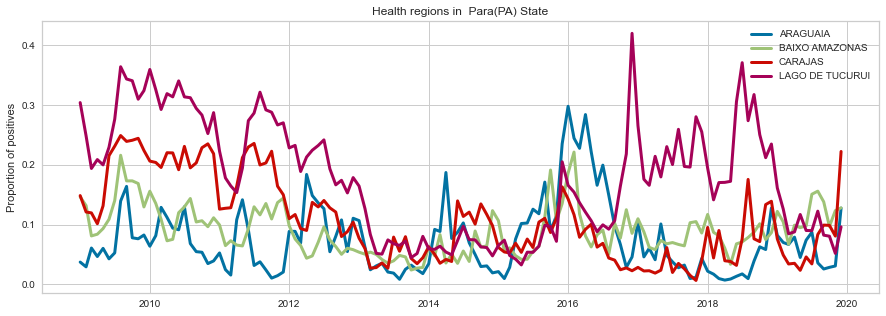

In [19]:
numhr = len(dataset_per_hr_new)
numtoplot = 4 #numhr # Set the number of health regions to plot out of the total number of health regions in a state
fig, ax = plt.subplots(figsize=(15,5))
for hr in range(numtoplot):
    plt.plot(dataset_per_hr_new[hr]['Date'],dataset_per_hr_new[hr]['monthlyPrevalence'],linewidth=3)
plt.legend(healthregions[:numtoplot])
plt.ylabel('Proportion of positives')
plt.title('Health regions in  Para(PA) State')
ymin=0; ymax=1

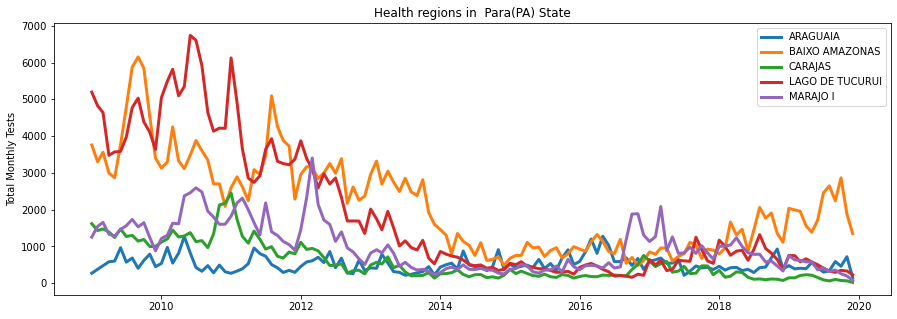

In [11]:
numhr = len(dataset_per_hr_new)
numtoplot = 5 #numhr # Set the number of health regions to plot out of the total number of health regions in a state
fig, ax = plt.subplots(figsize=(15,5))
for hr in range(numtoplot):
    plt.plot(dataset_per_hr_new[hr]['Date'],dataset_per_hr_new[hr]['totalTests'],linewidth=3)
plt.legend(healthregions[:numtoplot])
plt.ylabel('Total Monthly Tests')
plt.title('Health regions in  Para(PA) State')
ymin=0; ymax=1

In [9]:
#Helper function
def getHealthRegiontoPlot(hrID):
    return dataset_per_hr_new[hrID], healthregions[hrID]

In [121]:
# plot chosen health region based on its ID
hr_id = 4
firsthrdata,hr_name = getHealthRegiontoPlot(hr_id)

fig = px.line(firsthrdata, x="Date", y=['totalTests', 'negatives', 'positives'], title='Montly case data for ' + hr_name , template = 'plotly_dark')
fig.show()

In [11]:
firsthrdata['MA3'] = firsthrdata['monthlyPrevalence'].rolling(3).mean() # 3-month rolling average
firsthrdata['MA6'] = firsthrdata['monthlyPrevalence'].rolling(6).mean() # 6-month rolling average

fig = px.line(firsthrdata, x="Date", y=['monthlyPrevalence','MA3','MA6'], title='Montly case data for ' + hr_name, template = 'plotly_dark')
fig.show()

## Isolate health regions with epidemiological significance

In [12]:
ParaEpiHrOfInterest = ['TAPAJOS','BAIXO AMAZONAS','RIO CAETES','METROPOLITANA II']

In [13]:
 healthregions.index("METROPOLITANA II")

7

## Compute lag features

In [263]:
window = 6
subdata = returnPrevalenceData(dataset_per_hr_new[0],window)
subdata=prepareExpectedNames(subdata)

subdata.head()

,ds,y
0,2009-06-01,0.046028
1,2009-07-01,0.048589
2,2009-08-01,0.066942
3,2009-09-01,0.084126
4,2009-10-01,0.089346


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


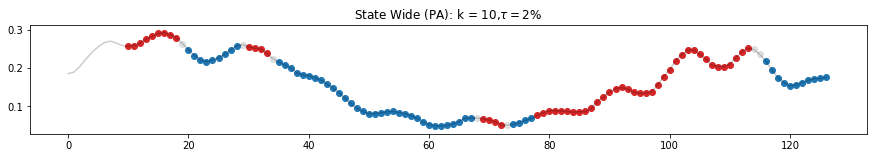

In [264]:
threshold = 2;lag = 10
stateWide = series
sWide = returnPrevalenceData(stateWide,window)
sWide = prepareExpectedNames(sWide)
lags210 = signalClass(sWide,threshold,lag,'State Wide (PA)')

In [265]:
sWide= sWide.drop(['label'],axis = 1)
sWide.head()

,ds,y
0,2009-06-01,0.185534
1,2009-07-01,0.189972
2,2009-08-01,0.205118
3,2009-09-01,0.224281
4,2009-10-01,0.241834


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-

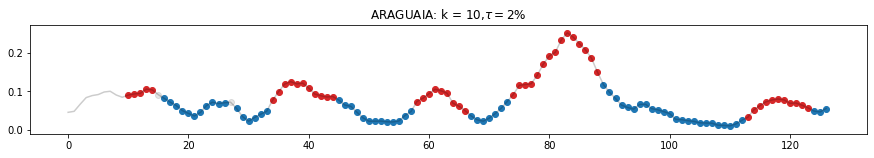

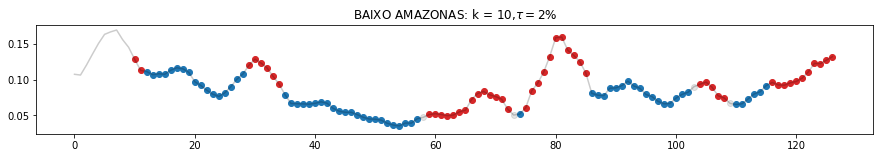

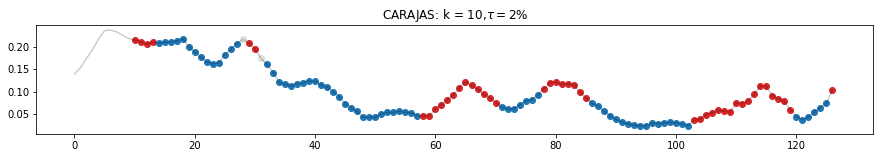

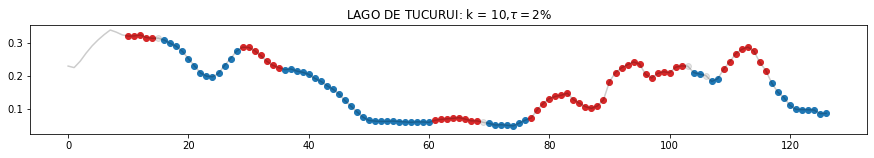

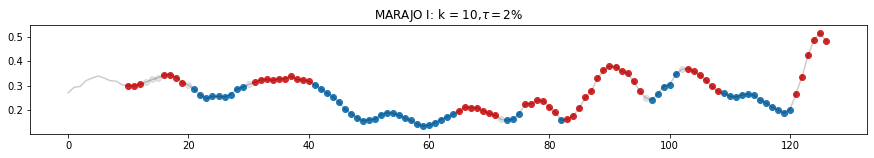

...

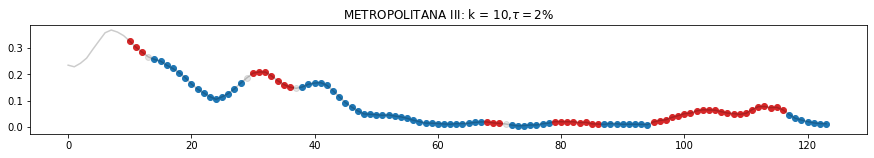

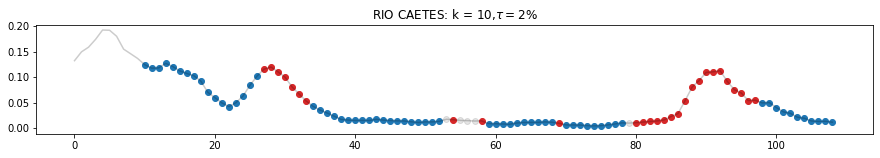

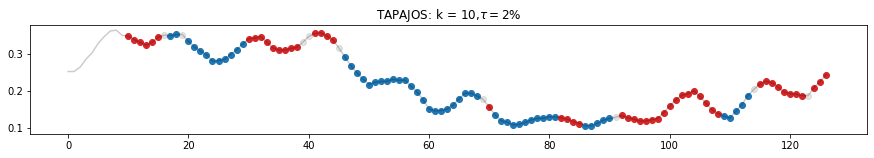

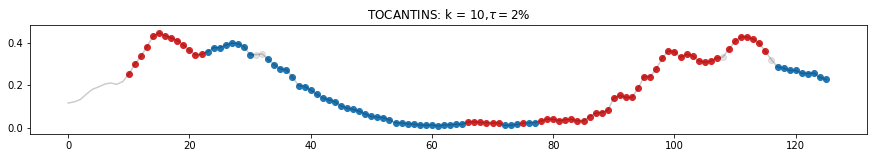

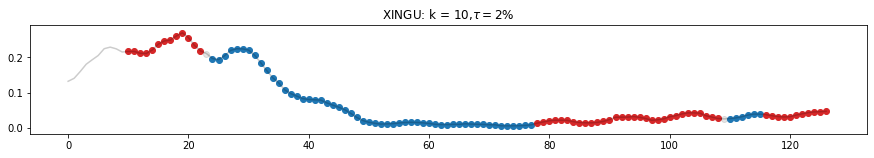

In [38]:
#Drill down to health regions (or munincipalities in the state )
lags = []
for hr in range(numtoplot):
    subdata = returnPrevalenceData(dataset_per_hr_new[hr],window)
    subdata=prepareExpectedNames(subdata) 
    thislag = signalClass(subdata,threshold,lag,healthregions[hr])
    lags.append(thislag)
    

In [22]:
print(len(lags))

13


In [266]:
for hr in range(13):
    print(str(healthregions[hr]) + ':' + str(len(lags[hr])))

ARAGUAIA:117
BAIXO AMAZONAS:117
CARAJAS:117
LAGO DE TUCURUI:117
MARAJO I:117
MARAJO II:117
METROPOLITANA I:117
METROPOLITANA II:99
METROPOLITANA III:114
RIO CAETES:99
TAPAJOS:117
TOCANTINS:116
XINGU:117


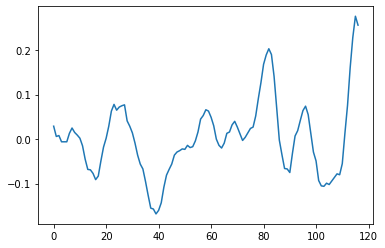

In [27]:
plt.plot(lags[4])

## Train the parent (State level) model

In [218]:
sWide.head()

,ds,y
0,2009-06-01,0.185534
1,2009-07-01,0.189972
2,2009-08-01,0.205118
3,2009-09-01,0.224281
4,2009-10-01,0.241834


In [267]:
#Portion of Trainset/test to use for different epidemic states - This could be manually or automatically assigned
steadyStart='2009-01-01';steadyEnd='2012-04-01' # Start and end of steady state timeseries
declineStart='2012-05-01';declineEnd='2015-01-01'
flareUpStart='2015-02-01';flareUpEnd='2018-10-01'

#General Test set
testStart='2018-11-01';testEnd='2019-12-01'

In [268]:
dataSet = sWide#prepareExpectedNames(returnPrevalenceData(sWide,window))
PACrossValidationTestSet = getDataSubset(dataSet,testStart,testEnd) #Test all models on this
PACrossValidationTestSet.head()

,ds,y
113,2018-11-01,0.252303
114,2018-12-01,0.248899
115,2019-01-01,0.235764
116,2019-02-01,0.218111
117,2019-03-01,0.195496


In [269]:
steadyStateData = getDataSubset(dataSet,steadyStart,steadyEnd)
declineStateData = getDataSubset(dataSet,declineStart,declineEnd)
flareUpStateData = getDataSubset(dataSet,flareUpStart,flareUpEnd)

C:\Users\ezep\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Training model for :  PA: Flare Up State Model
Total Possible Models: 4
 MAE train:0.013696397238033925,MAPE train: 13.723891631718288,MAE test: 0.022041478628257293,MAPE test: 9.792222922527301, Best training hyperparameters:{'changepoint_prior_scale': 0.01, 'changepoint_range': 1, 'holidays_prior_scale': 10, 'n_changepoints': 5, 'seasonality_mode': 'additive'}
Wall time: 43.3 s


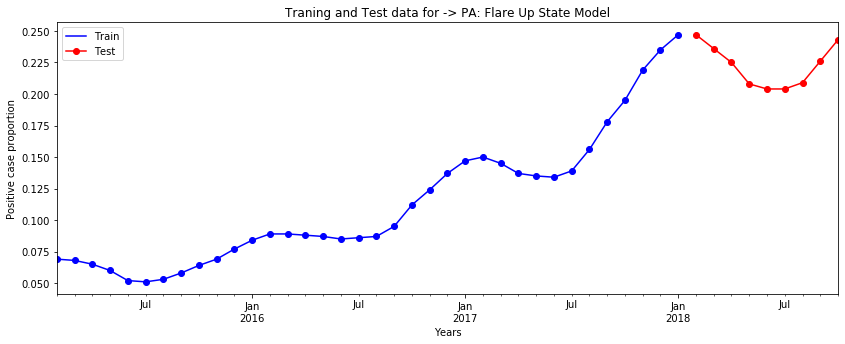

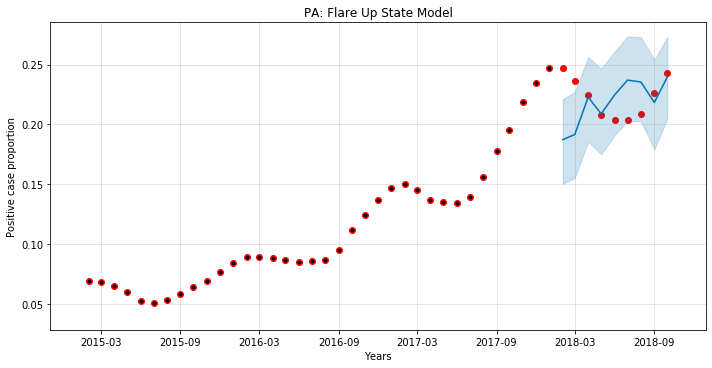

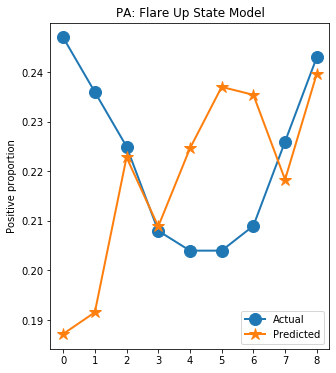

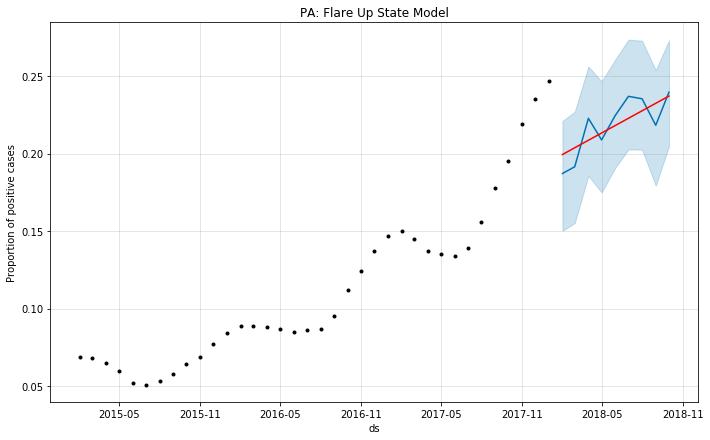

In [61]:
%%time
# define the period for which we want a prediction
testpoints= 9 #Last 9 months
window=1 #Averaging window
region='PA: Flare Up State Model'
FlareUp_best_model, FlareUpMAPEtrain,FlareUpmape =runSimulation(flareUpStateData)

## Compare State level case reports with regional case reports

In [76]:
# operate smoothing
smoother = LowessSmoother(smooth_fraction=0.1, iterations=1)
n_series = len(dataset_per_hr_new)

In [32]:
dataset_per_hr_new[9].dropna().tail(20)

,Date,notification.year,notification.month,monthlyPrevalence,negatives,positives,totalTests
94,2016-11-01,2016,11,0.098522,183,20.0,203.0
95,2016-12-01,2016,12,0.123529,149,21.0,170.0
96,2017-01-01,2017,1,0.052830,251,14.0,265.0
97,2017-02-01,2017,2,0.056818,249,15.0,264.0
98,2017-03-01,2017,3,0.043046,289,13.0,302.0
99,2017-04-01,2017,4,0.080000,138,12.0,150.0
100,2017-05-01,2017,5,0.059459,174,11.0,185.0
101,2017-06-01,2017,6,0.033708,172,6.0,178.0
102,2017-07-01,2017,7,0.056738,133,8.0,141.0
103,2017-08-01,2017,8,0.025157,155,4.0,159.0


In [463]:
def plotRandomWalk(data,region,confidence=0.70):
    fig3 = plt.figure(figsize=(10,3))
    
    # operate smoothing: LOESS (locally estimated scatterplot smoothing) and LOWESS (locally weighted scatterplot smoothing)
    smoother = LowessSmoother(smooth_fraction=0.1, iterations=5)
    smoother.smooth(data)

    # generate intervals
    low, up = smoother.get_intervals('sigma_interval', n_sigma=2) #
    low, up = smoother.get_intervals('prediction_interval',confidence=confidence)
    #plt.subplot(1,numtoplot,i+1)
    plt.plot(smoother.smooth_data[0], linewidth=2, color='tab:blue', alpha=1)
    plt.plot(smoother.data[0], '.k',alpha=0.3)
    tit = region #+ ', Confidence Level = ' + str(confidence)
    plt.title(tit); plt.xlabel('time (Months)')
    plt.ylabel('Proportion of positives')
    
    #flag flareup in case numbers
    for j in range(data.shape[0]):
        if up[0][j] < data[j]:
            plt.scatter(j, data[j],s=100, marker='8',
                   c='red', alpha=1.)
    
    # flag decline in case numbers
    for j in range(data.shape[0]):
        if low[0][j] > data[j]:
            plt.scatter(j, data[j], s=50, marker='*',c='green', alpha=1.)
            

    plt.fill_between(range(len(smoother.data[0])), low[0], up[0], alpha=0.3)

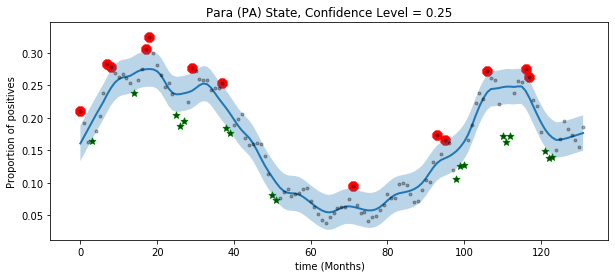

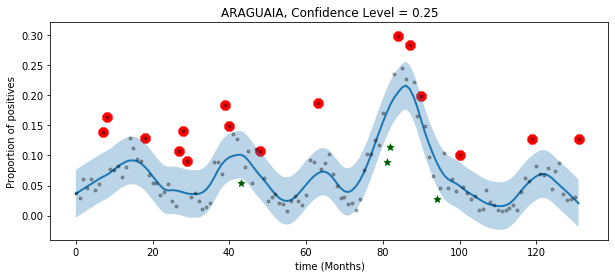

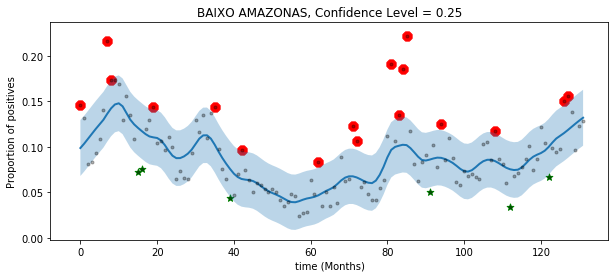

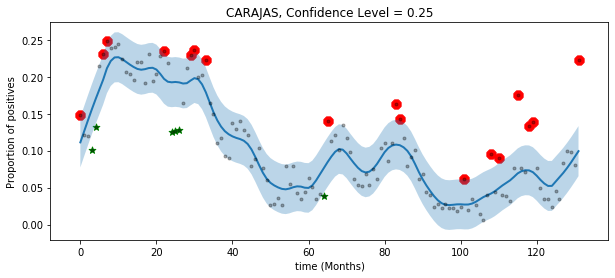

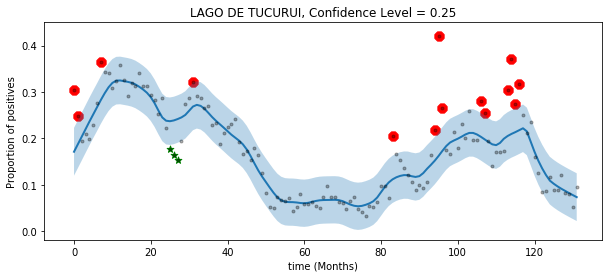

...

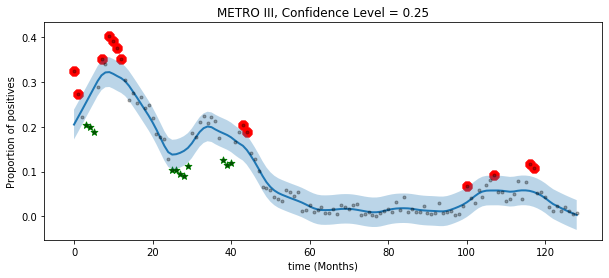

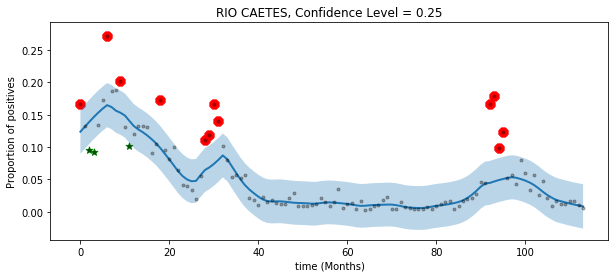

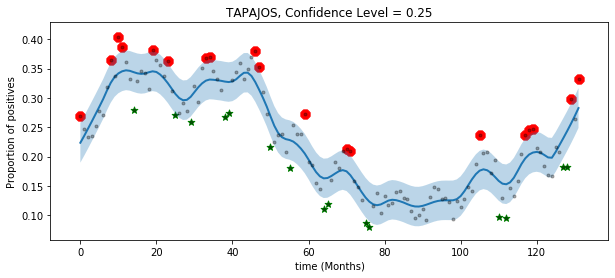

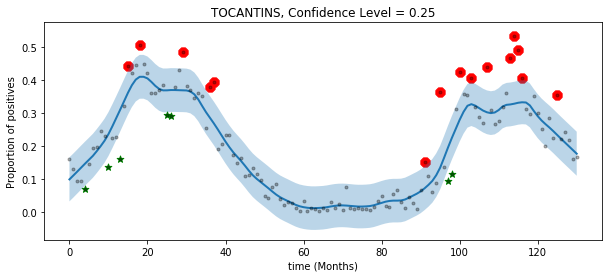

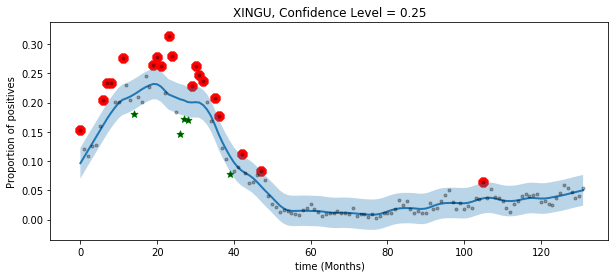

In [455]:
# plot the smoothed timeseries with intervals
numtoplot =13
confidencelevels = [0.25] #,0.25,0.5,0.75,0.95
confidence=0.5
n_sigma = 1
for confidence in confidencelevels:
    plotRandomWalk(series['monthlyPrevalence'],'Para (PA) State',confidence)
for confidence in confidencelevels:
    for i in range(numtoplot):
        data = dataset_per_hr_new[i]['monthlyPrevalence']
        plotRandomWalk(data,healthregions[i],confidence)

In [158]:
### UTILITY FUNCTION FOR PLOTTING ###

def plot_history(ax, i, is_anomaly, window_len, color='blue', **pltargs):
    
    posrange = np.arange(0,i)
    
    ax.fill_between(posrange[window_len:], 
                    pltargs['low'][1:], pltargs['up'][1:], 
                    color=color, alpha=0.2)
    if is_anomaly:
        ax.scatter(i-1, pltargs['original'][-1], c='red')
    else:
        ax.scatter(i-1, pltargs['original'][-1], c='black')
    ax.scatter(i-1, pltargs['smooth'][-1], c=color)
    
    ax.plot(posrange, pltargs['original'][1:], '.k')
    ax.plot(posrange[window_len:], 
            pltargs['smooth'][1:], color=color, linewidth=3)
    
    if 'ano_id' in pltargs.keys():
        if pltargs['ano_id'].sum()>0:
            not_zeros = pltargs['ano_id'][pltargs['ano_id']!=0] -1
            ax.scatter(not_zeros, pltargs['original'][1:][not_zeros], 
                       c='red', alpha=1.)

In [231]:
series['monthlyPrevalence']

Date
2009-01-01    0.211005
2009-02-01    0.191367
2009-03-01    0.163140
2009-04-01    0.164288
2009-05-01    0.180507
                ...   
2019-08-01    0.182221
2019-09-01    0.173547
2019-10-01    0.166615
2019-11-01    0.154901
2019-12-01    0.185564
Name: monthlyPrevalence, Length: 132, dtype: float64

In [245]:
confidencelevels = [0.05,0.25,0.5,0.75,0.95]
confidence=0.5
for i in confidencelevels:
    print (i)

0.05
0.25
0.5
0.75
0.95


## Correlation between State and health regional changes

In [461]:
def addMonthsToDate(startDate,window):
    date_format = '%Y-%m-%d'
    dtObj = datetime.strptime(startDate, date_format)
    # Add months to a given datetime object
    future_date = dtObj + relativedelta(months=window)
    # Convert datetime object to string in required format
    future_dt_str = future_date.strftime(date_format)
    return future_dt_str
def compute_n_lag(dset,n=6,threshold = 2,region = 'Test'):
    lags = []
    tau = threshold
    for i in range(n):
        k = i+1
        lag = signalClass(dset,tau,k,region)
        lags.append(lag)
    return lags
def computeEpidemicState(lags,window):
    steady = 0;decline = 0;flareup=0
    epiState=''; confidence_level=0
    for i in range(window-1):
        for j in lags[i]:
            if j > 0:
                print(f"t is {t}")
                flareup = flareup + 1
            elif j < 0:
                decline = decline + 1
            else:
                steady = steady + 1
    if steady == max(steady,decline,flareup):
        epiState = 'Steady state'
        confidence_level = steady/(steady + decline + flareup)
    elif decline == max(steady,decline,flareup):
        epiState = 'Decline'
        confidence_level = decline/(steady + decline + flareup)
    else:
        epiState = 'Flareup'
        confidence_level = flareup/(steady + decline + flareup)
    return epiState, confidence_level

2015-02-01---------------------------->2015-08-01
2015-08-01---------------------------->2016-02-01
2016-02-01---------------------------->2016-08-01
2016-08-01---------------------------->2017-02-01
2017-02-01---------------------------->2017-08-01
2017-08-01---------------------------->2018-02-01
2018-02-01---------------------------->2018-08-01


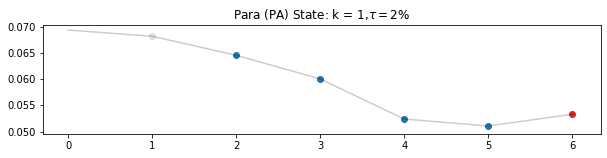

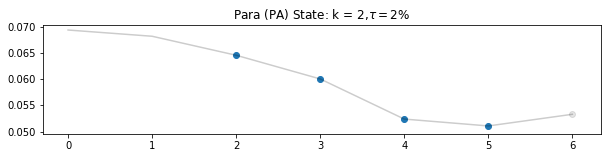

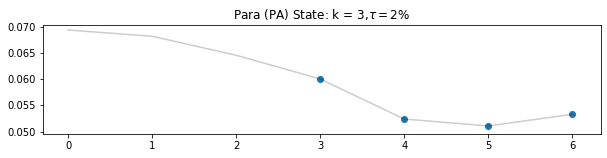

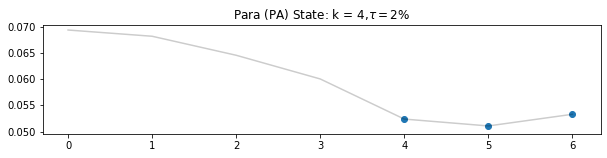

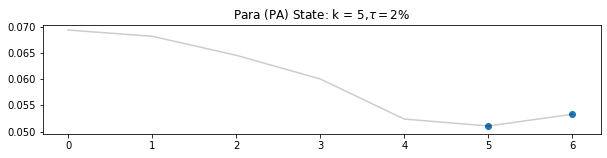

...

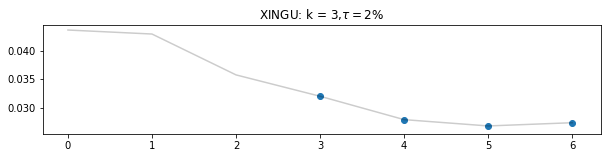

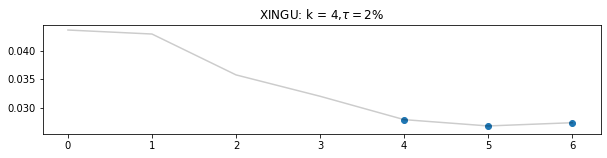

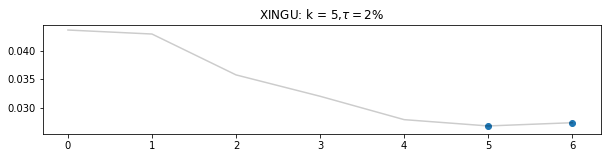

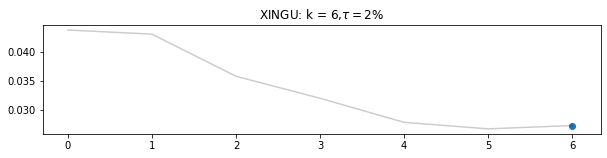

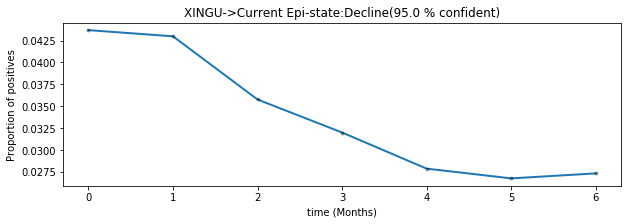

In [464]:

warnings.filterwarnings('ignore')
endDates = []
correlationsAll = []
confidence = 0.05
threshold = 2 # Percentage tolerance for case increase
totalTestDates = len(flareUpStateData)
totalIntervals = int(totalTestDates/window)
start = flareUpStart
for itv in range(totalIntervals):
    correlationsPerEndDate = []
    future_date_str = addMonthsToDate(start,window)
    endDates.append(future_date_str)
    stateLevelData = getDataSubset(flareUpStateData,start,future_date_str)
    
    
    #Compute lags to determine the epistate of current outbreak
    lags = compute_n_lag(stateLevelData.reset_index(drop=True),window,threshold,'Para (PA) State')
    epiState, confidence_level = computeEpidemicState(lags,window)
    #print(epiState, confidence_level)
    
    region_title = 'Para (PA) State->' + 'Current Epi-state:' + epiState + '(' + str(confidence_level*100) + ' % confident)'
    plotRandomWalk(stateLevelData['y'].values,region_title,confidence)
    plt.xlabel(start + ' - ' + future_date_str)
    
    
    print(start + '---------------------------->' + future_date_str )
    for hr in range(len(dataset_per_hr)):
        hrdata = returnPrevalenceData(dataset_per_hr_new[hr],window)
        hrdata=prepareExpectedNames(hrdata)
        flareUpHrData = getDataSubset(hrdata,start,future_date_str)
        corr1 = round(pd.Series(stateLevelData['y'].values).corr(pd.Series(flareUpHrData['y'].values)),2)
        
        #Compute lags to determine the epistate of current outbreak
        lags = compute_n_lag(flareUpHrData.reset_index(drop=True),window,threshold,healthregions[hr])
        epiState, confidence_level = computeEpidemicState(lags,window)
        region_title = healthregions[hr] + '->Current Epi-state:' + epiState + '(' + str(confidence_level*100) + ' % confident)'
        plotRandomWalk(flareUpHrData['y'].values,region_title,confidence)
        #plt.xlabel(start + ' - ' + future_date_str)
        #print(str(healthregions[hr])+ ':' + str(corr1))
        
        correlationsPerEndDate.append(corr1)
    correlationsAll.append(correlationsPerEndDate)
    start = future_date_str


    

In [284]:
totalTestDates = len(flareUpStateData)
totalIntervals = int(totalTestDates/window)

In [308]:
print(endDates )

['2015-08-01', '2016-02-01', '2016-08-01', '2017-02-01', '2017-08-01', '2018-02-01', '2018-08-01']


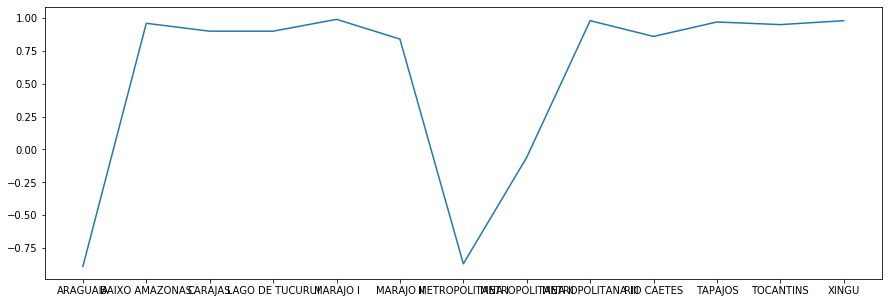

In [338]:
corrAll = np.array(correlationsAll)
for hr in range(len(dataset_per_hr)):
    fig, ax = plt.subplots(figsize=(15,5))
    plt.plot(healthregions,correlationsAll[0])

In [298]:
print(future_date)

2015-08-01 00:00:00


In [339]:
corrAll.shape

(7, 13)

In [345]:
corrT = np.transpose(corrAll)
corrT[0]

array([-0.89,  0.97, -0.66, -1.  , -0.44, -0.98,  0.86])

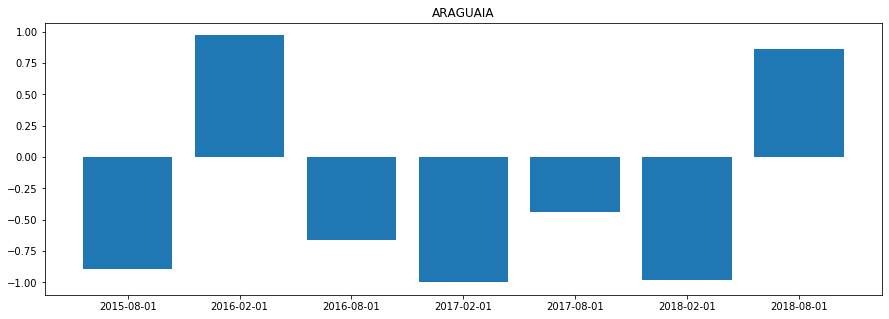

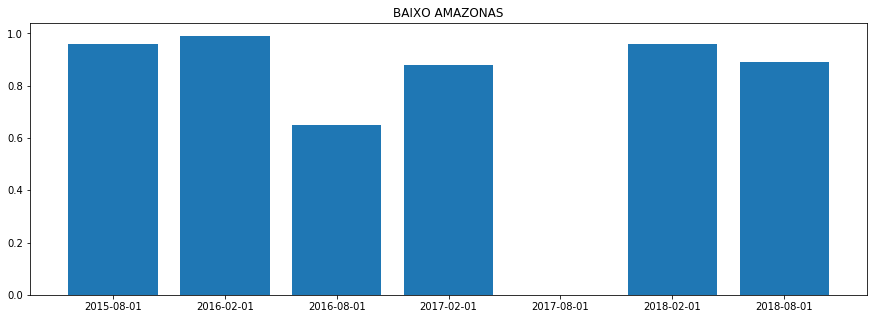

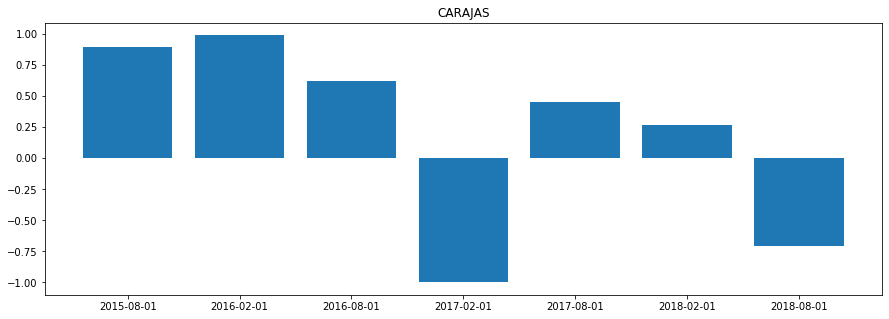

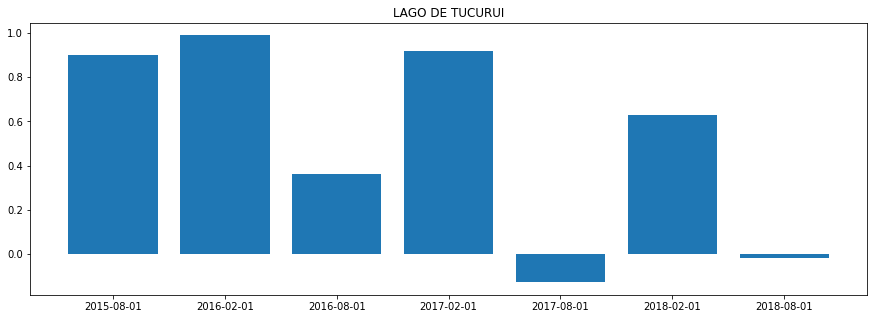

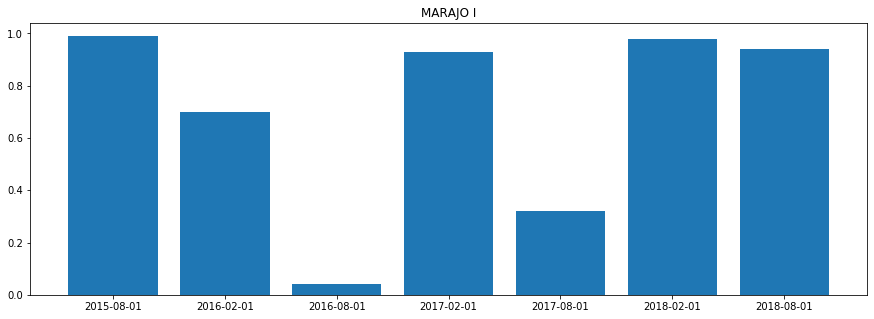

...

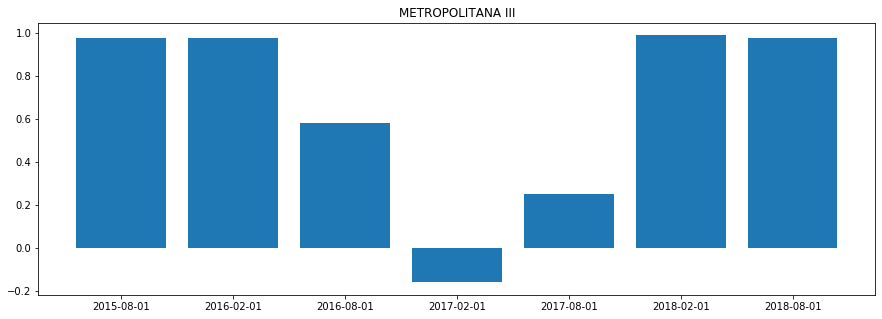

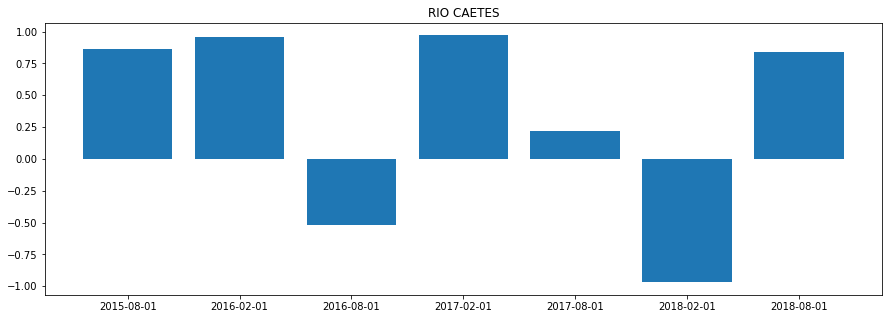

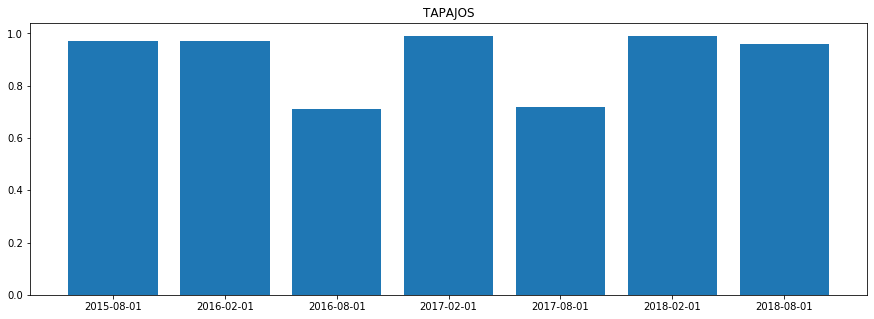

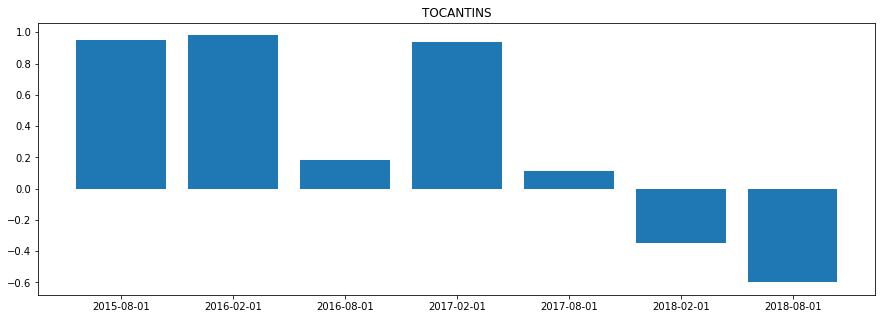

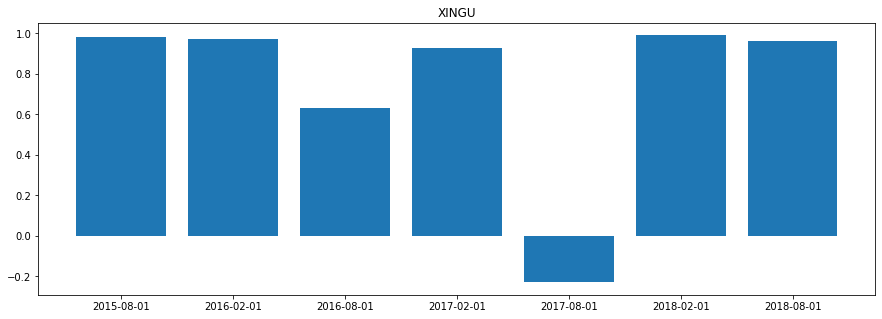

In [351]:
for hr in range(len(dataset_per_hr)):
    fig, ax = plt.subplots(figsize=(15,5))
    plt.bar(endDates,corrT[hr])
    plt.title(healthregions[hr])
    plt.ylabel('Correlation with State Data')

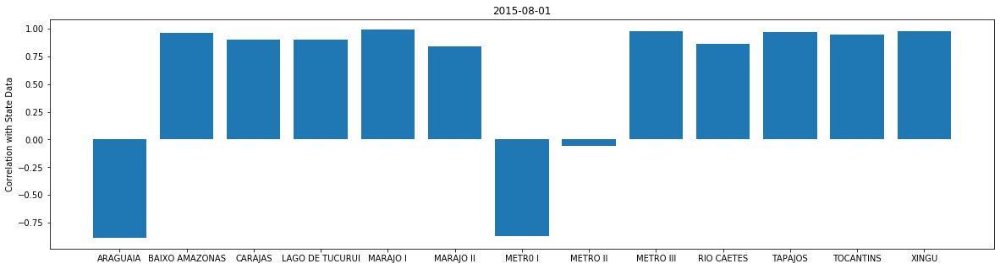

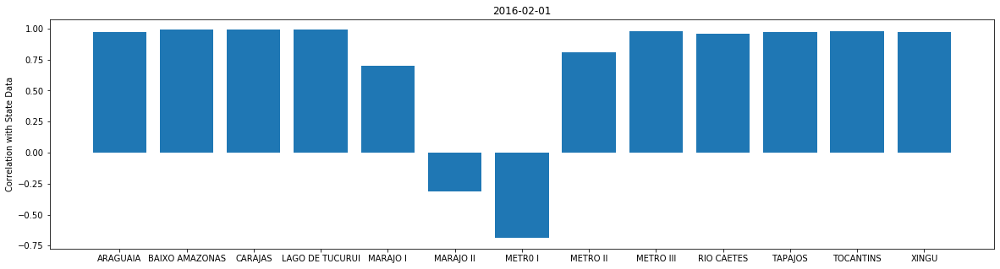

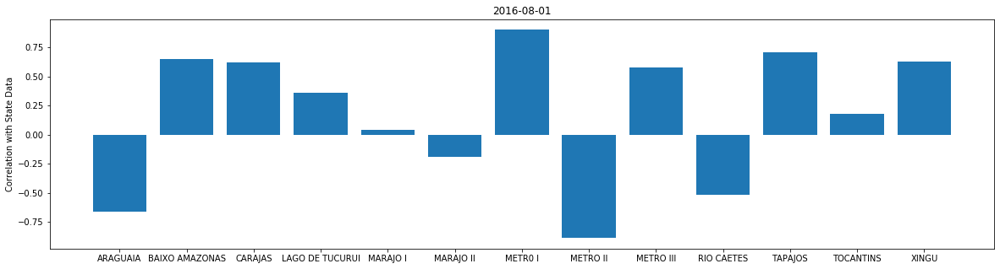

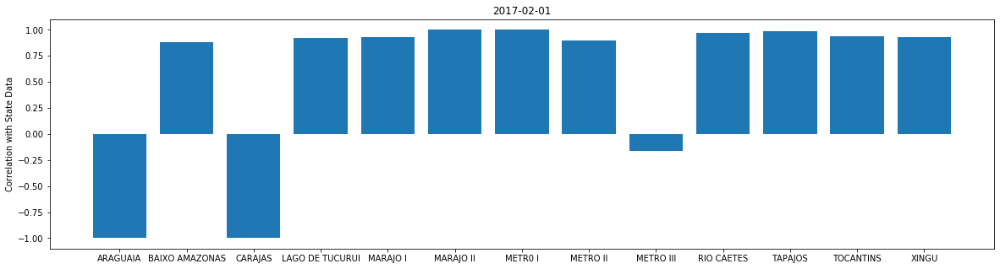

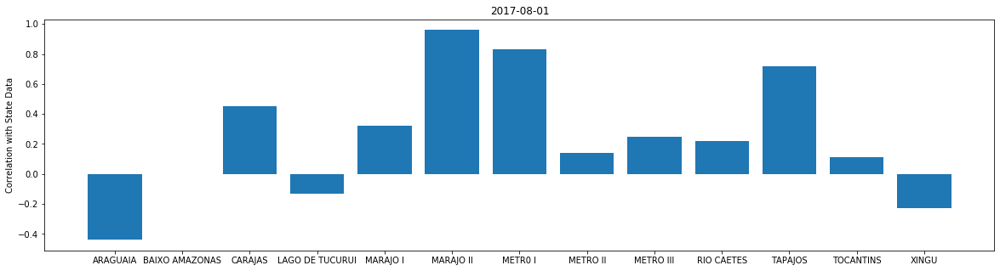

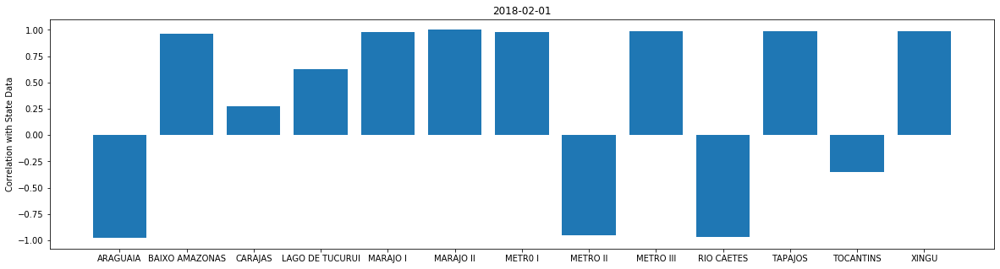

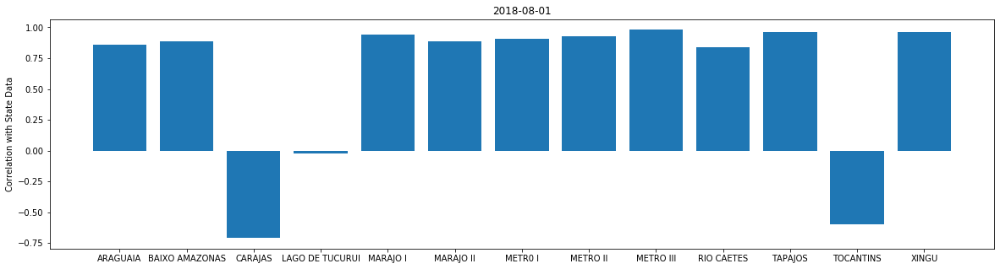

In [355]:
for itv in range(totalIntervals):
    fig, ax = plt.subplots(figsize=(20,5))
    plt.bar(healthregions,corrAll[itv])
    plt.title(endDates[itv])
    plt.ylabel('Correlation with State Data')

### Drift  Detection
Detect small shifts that accumulate into unnoticed flareup

In [436]:
#If any consecutive n-day (window size) lag is positive, send a drift alert if no anomaly was detected
# Alternatively, if any n-day lag is greater than a lag threshold but no collective anomaly has occured                              

In [437]:
import streamlit as st

### Anomaly Detection 

Anomaly detection algorithms can broadly be categorized into these groups:
    <ol>
<li> <b> Supervised </b>: Used when the data set has labels identifying which transactions are an anomaly and which are normal. (this is similar to a supervised classification problem).
<li> <b>Unsupervised </b>: Unsupervised means no labels and a model is trained on the complete data and assumes that the majority of the instances are normal.
<li> <b>Semi-Supervised </b>: A model is trained on normal data only (without any anomalies). When the trained model used on the new data points, it can predict whether the new data point is normal or not (based on the distribution of the data in the trained model).
</ol>

In [108]:
# creature features from date
def createFeaturesFromDate(firsthrdata):
    firsthrdata['day'] = [i.day for i in firsthrdata.index]
    firsthrdata['day_name'] = [i.day_name() for i in firsthrdata.index]
    firsthrdata['day_of_year'] = [i.dayofyear for i in firsthrdata.index]
    firsthrdata['week_of_year'] = [i.weekofyear for i in firsthrdata.index]
    firsthrdata['is_weekday'] = [i.isoweekday() for i in firsthrdata.index]
    return firsthrdata

#Print the number of anomalies detected by each model in the dataset
def printNumAnomalies(modelNames,n_anomalies):
    for m in range(num_of_Models):
        print(f" '{modelNames[m]}'  detected {n_anomalies[m]} anomalies")
        
#For each of the models, see how the anomaly score varies with the value of the outlier predictor value
def viewAnomalyScoreWithFeatures(model_results,hr_name):
    for m in range(num_of_Models):
        outliers = model_results[m][model_results[m]['Anomaly'] == 1]
        if len(outliers.index) > 0:
            fig = px.line(outliers, x=outliers.index, y=["monthlyPrevalence","Anomaly_Score"], title= hr_name + ':  '+ modelNames[m], template = 'plotly_dark')
        else:
            print(f" {modelNames[m]} detected no anomaly in {hr_name} data.")
        fig.show()
#We can now plot anomalies on the graph to visualize.
#UNSUPERVISED ANOMALY DETECTION
def plotAnomaliesForEachModel(model_results,hr_name,modelNames):
    threshold = 0.1
    for m in range(num_of_Models):
        outliers = model_results[m][model_results[m]['Anomaly'] == 1]
        outlier_dates = model_results[m][model_results[m]['Anomaly'] == 1].index
        # plot value on y-axis and date on x-axis
        fig = px.line(model_results[m], x=model_results[m].index, y="monthlyPrevalence", title= hr_name + ' - ' +  modelNames[m], template = 'plotly_dark')
        # create list of outlier_dates
    
        outlier_dates_flarup = outliers[outliers['Anomaly_Score'] >= (outliers['Anomaly_Score'].mean())].index
        outlier_dates_decline = outliers[outliers['Anomaly_Score'] < (outliers['Anomaly_Score'].mean())].index

        outlier_dates_flarup = outliers[outliers['monthlyPrevalence'] >= threshold].index
        outlier_dates_decline = outliers[outliers['monthlyPrevalence'] < threshold].index

        # obtain y value of anomalies to plot
    
        # obtain y value of flareup anomalies to plot
        y_values_flareup = [model_results[m].loc[i]['monthlyPrevalence'] for i in outlier_dates_flarup]

        # obtain y value of decline anomalies to plot
        y_values_decline = [model_results[m].loc[i]['monthlyPrevalence'] for i in outlier_dates_decline]
    
        y_values = [model_results[m].loc[i]['monthlyPrevalence'] for i in outlier_dates]
        fig.add_trace(go.Scatter(x=outlier_dates_flarup, y=y_values_flareup, mode = 'markers', 
                        name = 'Outbreak Anomaly', 
                        marker=dict(color='red',size=10)))
        fig.add_trace(go.Scatter(x=outlier_dates_decline, y=y_values_decline, mode = 'markers', 
                        name = 'Endemic Anomaly', 
                        marker=dict(color='green',size=10)))
        
        fig.show()
        
def interpreteAnomalies(model_results,modelNames):
    for m in range(num_of_Models):
        rcParams["figure.titlesize"] = 'small'
        sns.pairplot(model_results[m], hue = "Anomaly")
        plt.suptitle( hr_name + ':' + modelNames[m])

 'Angle-base Outlier Detection'  detected 14 anomalies
 'Clustering-Based Local Outlier'  detected 14 anomalies
 'Connectivity-Based Local Outlier'  detected 14 anomalies
 'Isolation Forest'  detected 14 anomalies
 'Histogram-based Outlier Detection'  detected 10 anomalies
 'K-Nearest Neighbors Detector'  detected 14 anomalies
 'Local Outlier Factor'  detected 14 anomalies
 'One-class SVM detector'  detected 14 anomalies
 'Principal Component Analysis'  detected 14 anomalies
 'Minimum Covariance Determinant'  detected 14 anomalies
 'Subspace Outlier Detection'  detected 0 anomalies
 'Stochastic Outlier Selection'  detected 14 anomalies


 Subspace Outlier Detection detected no anomaly in XINGU data.


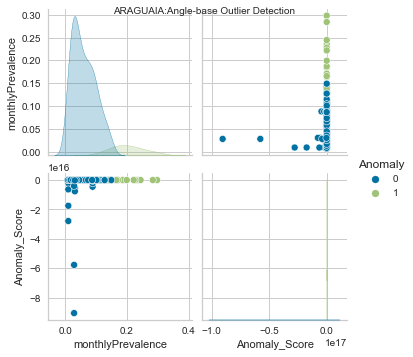

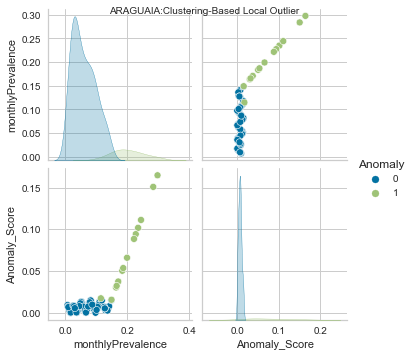

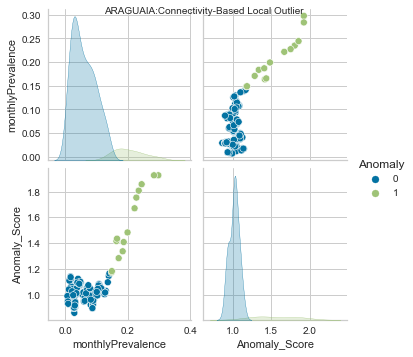

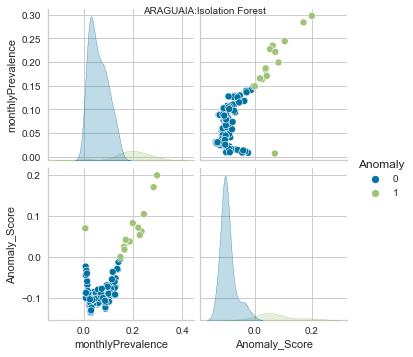

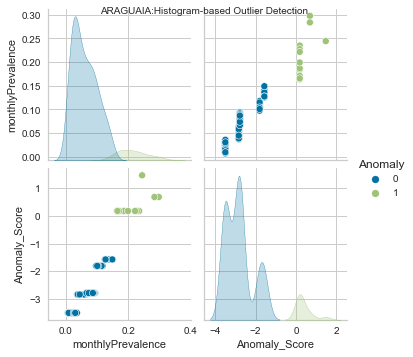

...

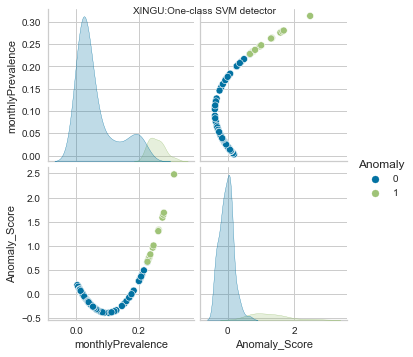

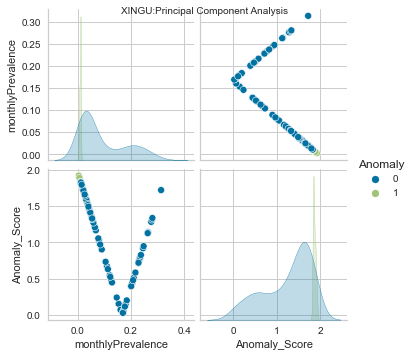

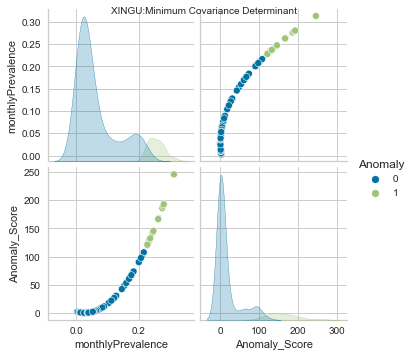

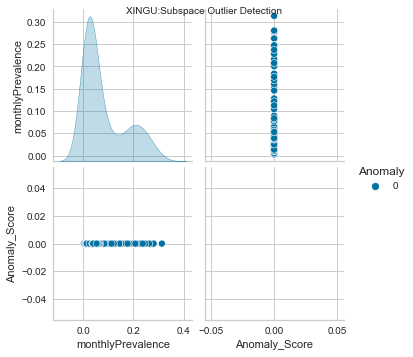

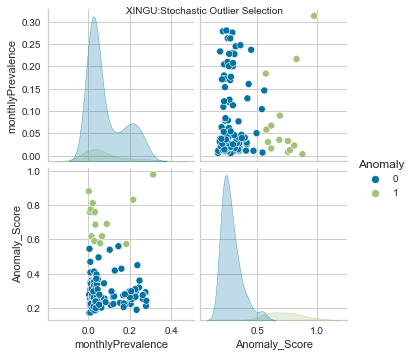

In [122]:
# init setup
numhr = len(healthregions)
hr_name = ''
num_of_Models = 0
fh=6
for hr in range(numhr): # For each health region in Para State
    currentHealthRegion,hr_name = getHealthRegiontoPlot(hr)
    print(hr_name)
    currentHealthRegion.dropna(axis=0, inplace=True)
    new_data = [currentHealthRegion["Date"],currentHealthRegion["monthlyPrevalence"]]
    headers = ["Date", "monthlyPrevalence"]
    new_data = pd.concat(new_data, axis=1, keys=headers)
    new_data.set_index('Date', drop=True, inplace=True) # set Date to index
    s = setup(new_data, session_id = 123,silent = True)
    n_anomalies =[]
    model_results = []
    all_models = []
    ms = models()
    modelIDs = ms.index
    modelNames = ms['Name']
    num_of_Models = len(modelIDs)
    
    # train model using the 12 non-supervised algorithms in pycaret
    for m in range(num_of_Models): #For each anomaly detection model provided by Pycaret
        model = create_model(modelIDs[m], fraction = 0.1)
        all_models.append(model)
        model_result = assign_model(model)
        model_results.append(model_result)
        num_anomalies = len(model_result[model_result['Anomaly'] == 1])
        n_anomalies.append(num_anomalies)
    printNumAnomalies(modelNames,n_anomalies)
    viewAnomalyScoreWithFeatures(model_results,hr_name)
    plotAnomaliesForEachModel(model_results,hr_name,modelNames)
    
    #To see which points will count as anomalies.
    try:
      interpreteAnomalies(model_results,modelNames)
    except:
      print("An exception occurred")
    



In [12]:
# check list of available models
models()

In [25]:
# check the feature values, dates and scores for flagged anomalies
modelToExamin = 4
model_results[modelToExamin][model_results[modelToExamin]['Anomaly'] == 1].head(20)

,monthlyPrevalence,Anomaly,Anomaly_Score
Date,,,
2016-10-01,0.464609,1,0.743988
2016-12-01,0.445295,1,0.743988
2017-09-01,0.417800,1,0.743988
2017-11-01,0.416565,1,0.743988
2019-07-01,0.536058,1,1.080652
2019-08-01,0.580952,1,1.080652
2019-09-01,0.718310,1,2.156680
2019-10-01,0.560784,1,1.080652


In [31]:
plot_model(iforest)

In [117]:
#We can now plot anomalies on the graph to visualize.
#UNSUPERVISED ANOMALY DETECTION

for m in range(num_of_Models):
    outliers = model_results[m][model_results[m]['Anomaly'] == 1]
    outlier_dates = model_results[m][model_results[m]['Anomaly'] == 1].index
    # plot value on y-axis and date on x-axis
    fig = px.line(model_results[m], x=model_results[m].index, y="monthlyPrevalence", title= hr_name + ' - ' +  modelNames[m], template = 'plotly_dark')
    # create list of outlier_dates
    
    outlier_dates_flarup = outliers[outliers['Anomaly_Score'] >= (outliers['Anomaly_Score'].mean())].index
    outlier_dates_decline = outliers[outliers['Anomaly_Score'] < (outliers['Anomaly_Score'].mean())].index

    outlier_dates_flarup = outliers[outliers['monthlyPrevalence'] >= 0.1].index
    outlier_dates_decline = outliers[outliers['monthlyPrevalence'] < 0.1].index

    # obtain y value of anomalies to plot
    
    # obtain y value of flareup anomalies to plot
    y_values_flareup = [model_results[m].loc[i]['monthlyPrevalence'] for i in outlier_dates_flarup]

    # obtain y value of decline anomalies to plot
    y_values_decline = [model_results[m].loc[i]['monthlyPrevalence'] for i in outlier_dates_decline]
    
    y_values = [model_results[m].loc[i]['monthlyPrevalence'] for i in outlier_dates]
    fig.add_trace(go.Scatter(x=outlier_dates_flarup, y=y_values_flareup, mode = 'markers', 
                    name = 'Outbreak Anomaly', 
                    marker=dict(color='red',size=10)))
    fig.add_trace(go.Scatter(x=outlier_dates_decline, y=y_values_decline, mode = 'markers', 
                    name = 'Endemic Anomaly', 
                    marker=dict(color='green',size=10)))
        
    fig.show()

In [34]:
save_model(all_models[7],'SVM_Model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None...
                 ('dummy', Dummify(target='UNSUPERVISED_DUMMY_TARGET')),
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca',

## Future tasks 
<ol>
    <li> Compare results with other unsupervised, semi-supervised and supervised algorithms</li>
    <li> Validate result with epidemiologists in the region </li>
    <li> iteratively define anomalies manually with human experts and re-evaluate all existing algorithms </li>
    <li> Provide explanaible and interpretable implementation of the best algorithm for anomaly detection </li>
    <li> Incorporate prediction and forcasting to achieve early detection of disease outbreaks irrespective of seasonality of case numbers </li>
    <li> Use NLP to explain the anomaly points with respect to the time and space where anomaly was detected </li>
 </ol>

In [35]:
#Load a saved model
svmodel = load_model('SVM_Model')

Transformation Pipeline and Model Successfully Loaded


In [36]:
print(svmodel)

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill_value_categorical=None,
                                fill_value_numerical=None...
                ('dummy', Dummify(target='UNSUPERVISED_DUMMY_TARGET')),
                ('fix_perfect', 'passthrough'),
                ('clean_names', Clean_Colum_Names()),
                ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                ('dfs', 'passthrough'), ('pca', 'passthrough'),
